In [1]:
import sys
import os
import json
import torch
from torch.utils.data import DataLoader
import torchvision
import torchvision.models as models
import numpy as np
import cv2
import matplotlib.pyplot as plt

from pathlib import Path
# Add the parent directory to the Python path
sys.path.append(str(Path().resolve().parent))
import utils
import trainer
import evaluator
import data_process
import motion_blur

# Set random seed for reproducibility
seed = 211
np.random.seed(seed)
torch.manual_seed(seed)

In [2]:
input_size = 448

transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((input_size, input_size)),
    torchvision.transforms.ToTensor(), # uint8 values in [0, 255] -> float tensor with values [0, 1]
    torchvision.transforms.Normalize(mean=data_process.train_mean.tolist(), std=data_process.train_std.tolist())
])

train_set, val_set, test_set = data_process.load_data(transform=transform, input_size=input_size, img_dir=os.path.join('..', data_process.img_dir), ann_dir=os.path.join('..', data_process.ann_dir))   

test_set_uni_001 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.01})
test_set_uni_005 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.05})
test_set_uni_01 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.1})
test_set_elli_001 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.01})
test_set_elli_005 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.05})
test_set_elli_01 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.1})
test_set_nat = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'natural', 'kernel_path': '../data/motion_blur_data'})

Data already exists

Number of valid images: 664
Train set size: 464 - 69.88%
Validation set size: 67 - 10.09%
Test set size: 133 - 20.03%



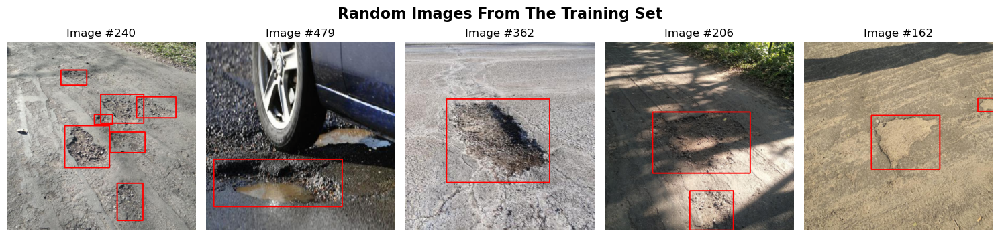

In [3]:
# Display 5 random images from the training set
train_loader = DataLoader(train_set, batch_size=5, shuffle=True, collate_fn=data_process.collate_fn)
images, targets = next(iter(train_loader))
data_process.show_images(images, targets, title="Random Images From The Training Set")

In [4]:
# Train with data augmentation:
history = trainer.train_from_config(model_config_path="../data/models/fasterrcnn_resnet50_fpn/fasterrcnn_resnet50_fpn_best_params.json", train_set=train_set, val_set=val_set, save_path="../data/models/fasterrcnn_resnet50_fpn", kornia_aug=False)

Starting training for fasterrcnn_resnet50_fpn with the following parameters:
{'batch_size': 8, 'epochs': 100, 'preweight_mode': 'fine_tuning', 'optimizer': 'SGD', 'lr': 0.005077286891014731, 'momentum': 0.9410626508845523, 'weight_decay': 6.509385638898574e-05, 'scheduler': 'CosineAnnealingLR', 'T_max': 6, 'eta_min': 3.181777359507687e-07}
Epoch 1/100, Train Loss: 31.8453, Val mAP@50: 0.3636, FPS: 54.33, Epoch Time: 23.55 seconds
Epoch 2/100, Train Loss: 18.2851, Val mAP@50: 0.5638, FPS: 54.25, Epoch Time: 23.11 seconds
Epoch 3/100, Train Loss: 15.1772, Val mAP@50: 0.6551, FPS: 54.57, Epoch Time: 23.10 seconds
Epoch 4/100, Train Loss: 13.4638, Val mAP@50: 0.6828, FPS: 54.59, Epoch Time: 23.16 seconds
Epoch 5/100, Train Loss: 11.5918, Val mAP@50: 0.7373, FPS: 54.55, Epoch Time: 23.25 seconds
Epoch 6/100, Train Loss: 10.2933, Val mAP@50: 0.7427, FPS: 58.73, Epoch Time: 22.75 seconds
Epoch 7/100, Train Loss: 9.8805, Val mAP@50: 0.7427, FPS: 55.13, Epoch Time: 21.90 seconds
Epoch 8/100, Tr

Mean Average Precision @ 0.5 : 0.7006 FPS: 50.30


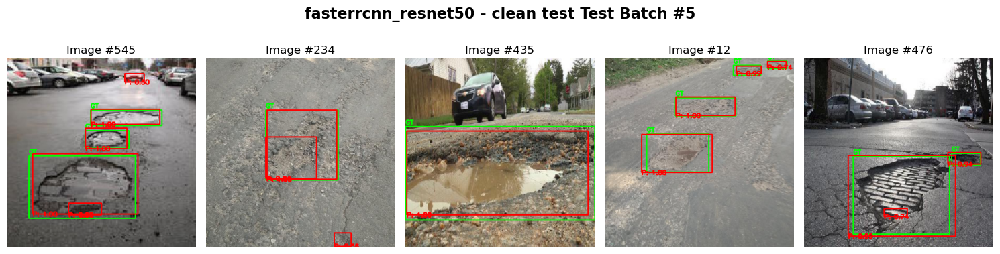

Mean Average Precision @ 0.5 : 0.5770 FPS: 50.20


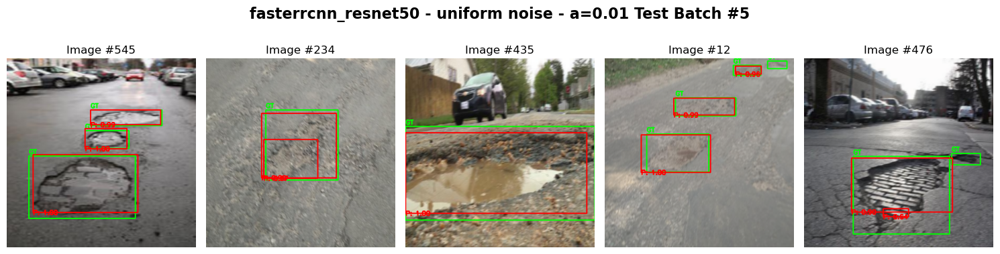

Mean Average Precision @ 0.5 : 0.2036 FPS: 50.40


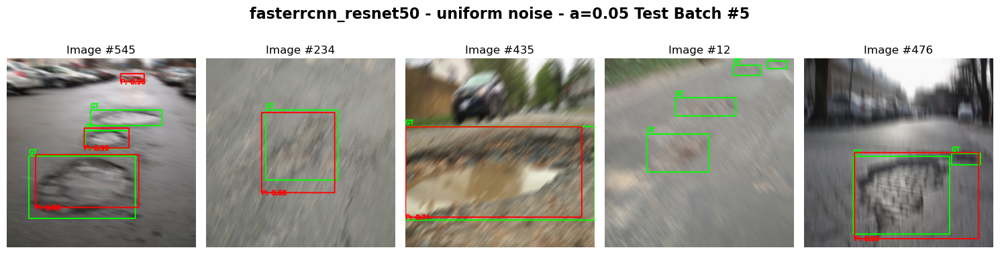

Mean Average Precision @ 0.5 : 0.0309 FPS: 50.46


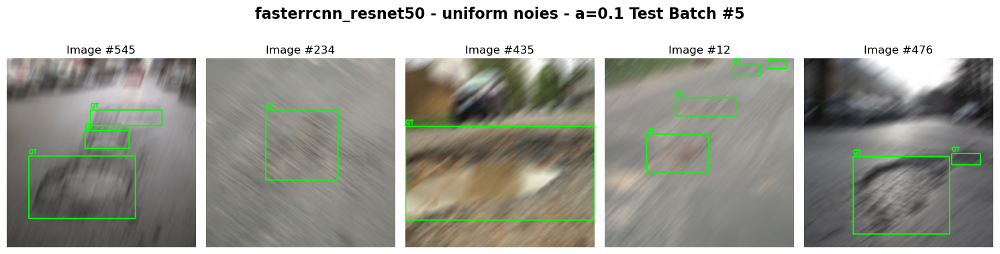

Mean Average Precision @ 0.5 : 0.5707 FPS: 50.14


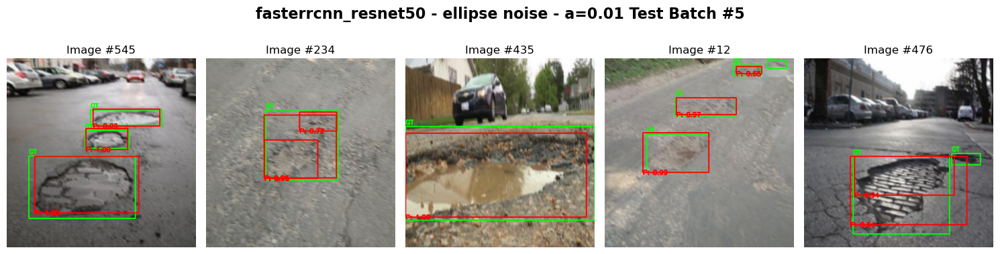

Mean Average Precision @ 0.5 : 0.1947 FPS: 50.45


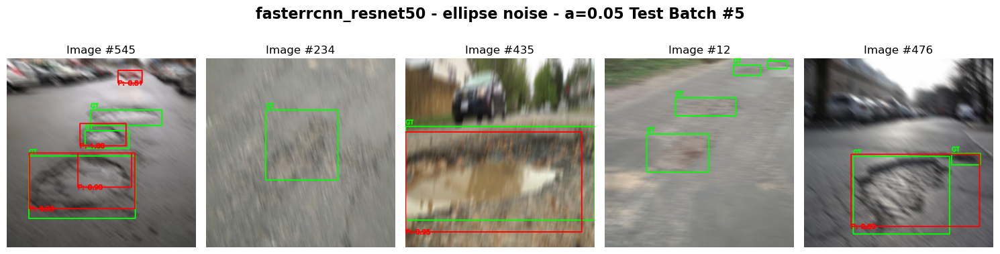

Mean Average Precision @ 0.5 : 0.0239 FPS: 50.48


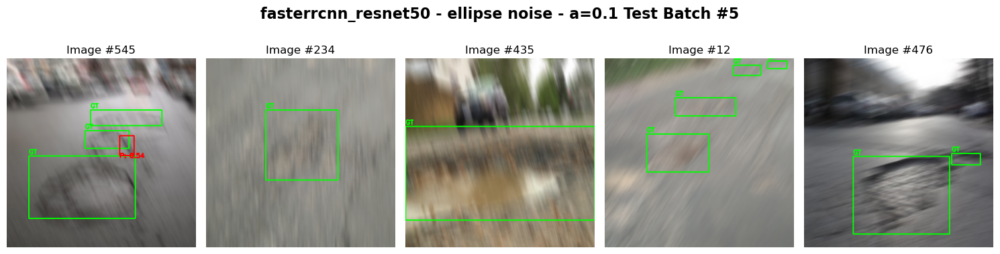

Mean Average Precision @ 0.5 : 0.4210 FPS: 50.32


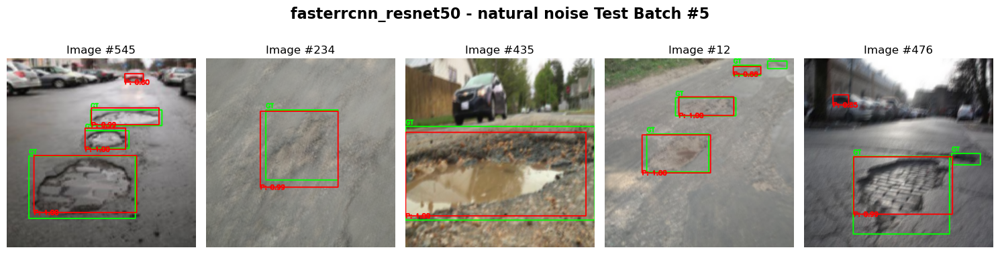

In [13]:
model_name = "fasterrcnn_resnet50_fpn"
model = trainer.get_model(model_name=model_name) 
state_dict = torch.load("../data/models/fasterrcnn_resnet50_fpn/fasterrcnn_resnet50_fpn_best.pth", weights_only=True)
model.load_state_dict(state_dict)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move the model to the GPU
model.eval()  # Set the model to evaluation mode

# test the model
batch_index = 5
history['test_map50'] = evaluator.test_model(model, test_set, index=batch_index, title="fasterrcnn_resnet50 - clean test")
history['uni001_map50'] = evaluator.test_model(model, test_set_uni_001, index=batch_index, title="fasterrcnn_resnet50 - uniform noise - a=0.01")
history['uni005_map50'] = evaluator.test_model(model, test_set_uni_005, index=batch_index, title="fasterrcnn_resnet50 - uniform noise - a=0.05")
history['uni01_map50'] = evaluator.test_model(model, test_set_uni_01, index=batch_index, title="fasterrcnn_resnet50 - uniform noies - a=0.1")
history['eli001_map50'] = evaluator.test_model(model, test_set_elli_001, index=batch_index, title="fasterrcnn_resnet50 - ellipse noise - a=0.01")
history['eli005_map50'] = evaluator.test_model(model, test_set_elli_005, index=batch_index, title="fasterrcnn_resnet50 - ellipse noise - a=0.05")
history['eli01_map50'] = evaluator.test_model(model, test_set_elli_01, index=batch_index, title="fasterrcnn_resnet50 - ellipse noise - a=0.1")
history['nat_map50'] = evaluator.test_model(model, test_set_nat, index=batch_index, title="fasterrcnn_resnet50 - natural noise")

In [6]:
# save history to .json file
utils.update_json(history, model_name="fasterrcnn_resnet")

In [7]:
# Train with data augmentation:
trainer.train_from_config(model_config_path="../data/models/fasterrcnn_resnet50_fpn/fasterrcnn_resnet50_fpn_best_params.json", train_set=train_set, val_set=val_set, save_path="../data/models/fasterrcnn_resnet50_fpn", kornia_aug=True)

Starting training for fasterrcnn_resnet50_fpn with the following parameters:
{'batch_size': 8, 'epochs': 100, 'preweight_mode': 'fine_tuning', 'optimizer': 'SGD', 'lr': 0.005077286891014731, 'momentum': 0.9410626508845523, 'weight_decay': 6.509385638898574e-05, 'scheduler': 'CosineAnnealingLR', 'T_max': 6, 'eta_min': 3.181777359507687e-07}
Epoch 1/100, Train Loss: 25.1110, Val mAP@50: 0.4927, FPS: 58.59, Epoch Time: 23.00 seconds
Epoch 2/100, Train Loss: 18.2002, Val mAP@50: 0.6698, FPS: 54.40, Epoch Time: 22.86 seconds
Epoch 3/100, Train Loss: 16.6587, Val mAP@50: 0.6969, FPS: 58.15, Epoch Time: 22.96 seconds
Epoch 4/100, Train Loss: 15.1535, Val mAP@50: 0.7454, FPS: 58.33, Epoch Time: 22.08 seconds
Epoch 5/100, Train Loss: 14.3215, Val mAP@50: 0.7545, FPS: 58.40, Epoch Time: 22.02 seconds
Epoch 6/100, Train Loss: 13.2637, Val mAP@50: 0.7725, FPS: 58.47, Epoch Time: 21.98 seconds
Epoch 7/100, Train Loss: 13.2092, Val mAP@50: 0.7725, FPS: 58.33, Epoch Time: 22.01 seconds
Epoch 8/100, T

{'train_losses': [25.11095494031906,
  18.200218960642815,
  16.658676132559776,
  15.153482295572758,
  14.321517400443554,
  13.263659685850143,
  13.209226205945015,
  13.719049908220768,
  13.669577680528164,
  13.221171073615551,
  13.96260841935873,
  13.942512445151806,
  13.270608305931091,
  11.786835066974163,
  11.507084906101227,
  10.371554896235466,
  9.691331095993519,
  9.416925333440304,
  9.182908818125725,
  8.701266344636679,
  10.080225072801113,
  9.172071397304535,
  10.002790696918964,
  10.71117528155446,
  9.692173101007938,
  9.46698933839798,
  10.028015807271004,
  8.41001045703888,
  7.678266808390617,
  7.90979541093111,
  7.801557134836912,
  7.501752879470587,
  7.329328186810017,
  7.667056653648615,
  8.31953164190054,
  9.20168574899435,
  8.20747547596693,
  8.52643034979701,
  8.825846195220947,
  7.600742977112532,
  6.25639707967639,
  6.750400424003601,
  6.552371520549059,
  6.078296534717083,
  6.379843171685934,
  6.540259059518576,
  6.84681

Mean Average Precision @ 0.5 : 0.7980 FPS: 50.08


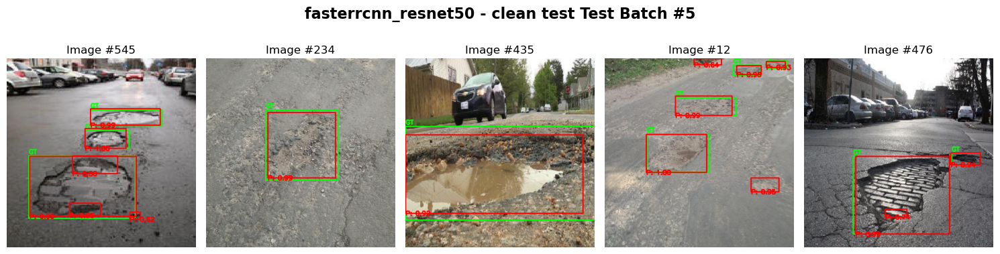

Mean Average Precision @ 0.5 : 0.7327 FPS: 49.66


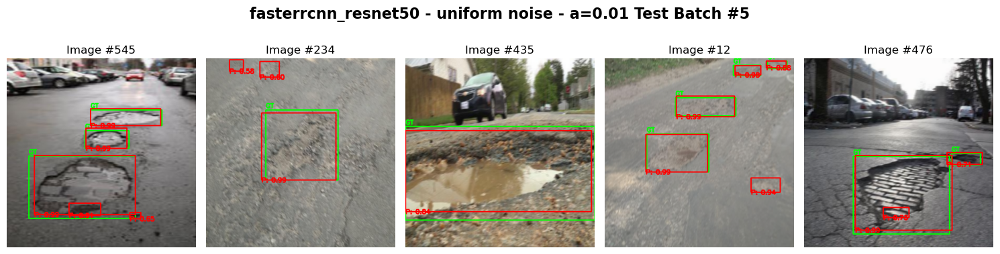

Mean Average Precision @ 0.5 : 0.5533 FPS: 50.01


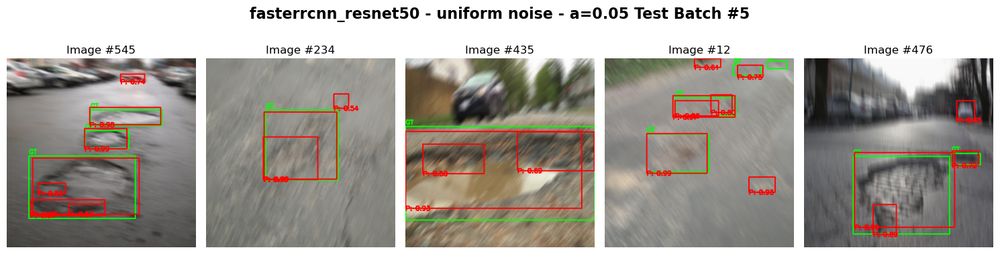

Mean Average Precision @ 0.5 : 0.3419 FPS: 49.86


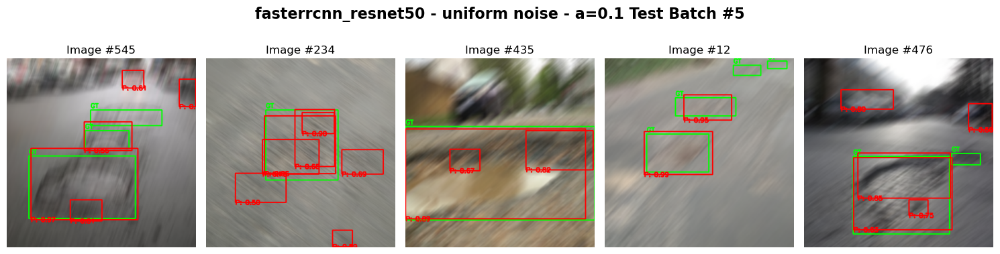

Mean Average Precision @ 0.5 : 0.7260 FPS: 50.06


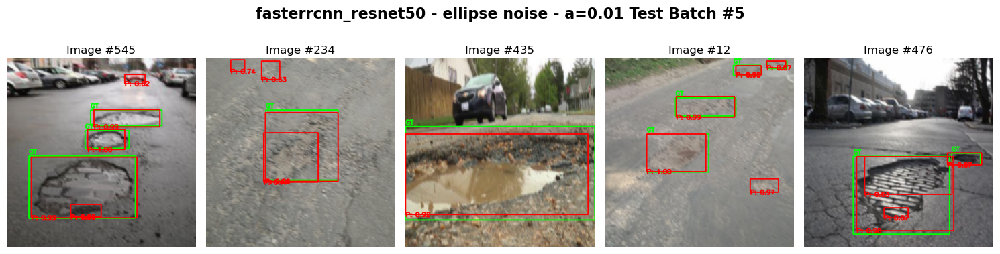

Mean Average Precision @ 0.5 : 0.4879 FPS: 50.02


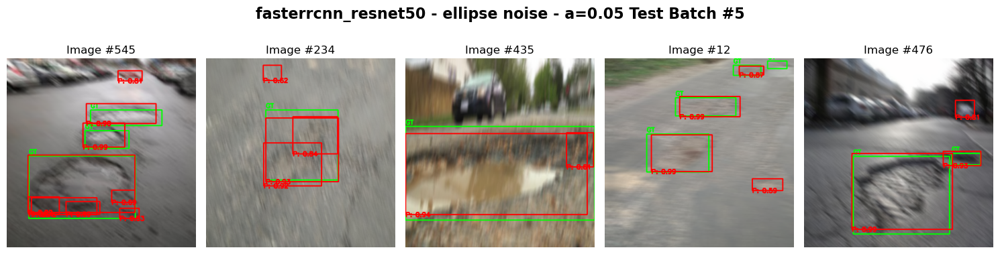

Mean Average Precision @ 0.5 : 0.2035 FPS: 50.04


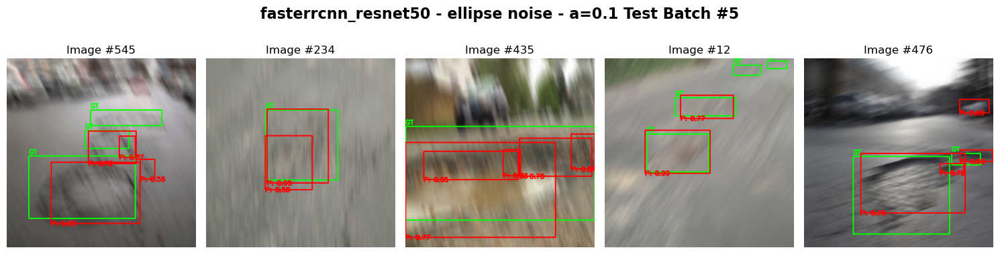

Mean Average Precision @ 0.5 : 0.5566 FPS: 50.15


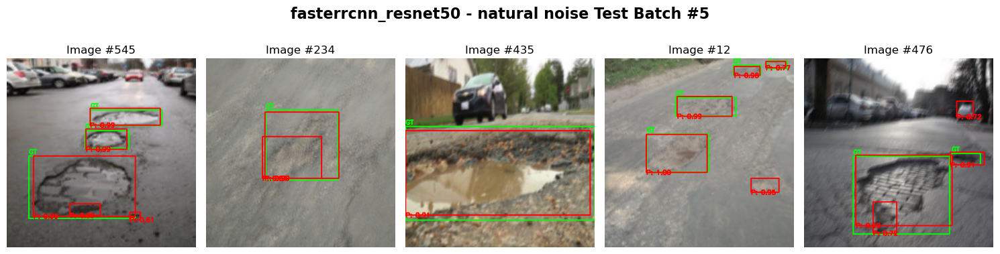

In [ ]:
model_name = "fasterrcnn_resnet50_fpn"
model = trainer.get_model(model_name=model_name) 
state_dict = torch.load("../data/models/fasterrcnn_resnet50_fpn/fasterrcnn_resnet50_fpn_aug_best.pth", weights_only=True)
model.load_state_dict(state_dict)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move the model to the GPU
model.eval()  # Set the model to evaluation mode

# test the model
batch_index = 5
history['test_map50'] = evaluator.test_model(model, test_set, index=batch_index, title="fasterrcnn_resnet50 - clean test")
history['uni001_map50'] = evaluator.test_model(model, test_set_uni_001, index=batch_index, title="fasterrcnn_resnet50 - uniform noise - a=0.01")
history['uni005_map50'] = evaluator.test_model(model, test_set_uni_005, index=batch_index, title="fasterrcnn_resnet50 - uniform noise - a=0.05")
history['uni01_map50'] = evaluator.test_model(model, test_set_uni_01, index=batch_index, title="fasterrcnn_resnet50 - uniform noise - a=0.1")
history['eli001_map50'] = evaluator.test_model(model, test_set_elli_001, index=batch_index, title="fasterrcnn_resnet50 - ellipse noise - a=0.01")
history['eli005_map50'] = evaluator.test_model(model, test_set_elli_005, index=batch_index, title="fasterrcnn_resnet50 - ellipse noise - a=0.05")
history['eli01_map50'] = evaluator.test_model(model, test_set_elli_01, index=batch_index, title="fasterrcnn_resnet50 - ellipse noise - a=0.1")
history['nat_map50'] = evaluator.test_model(model, test_set_nat, index=batch_index, title="fasterrcnn_resnet50 - natural noise")

In [9]:
# save history to .json file
utils.update_json(history, model_name="fasterrcnn_resnet_aug")